In [3]:
!pip install transformers

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [4]:
import numpy as np
import seaborn as sns
import itertools 
import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx
import os

rc={
    'font.size': 8, 'axes.labelsize': 8, 'legend.fontsize': 10.0, 
    'axes.titlesize': 32, 'xtick.labelsize': 20, 'ytick.labelsize': 16
}
plt.rcParams.update(**rc)
mpl.rcParams['axes.linewidth'] = .5 #set the value globally
import seaborn as sns; sns.set()
sns.set_style("whitegrid")
mpl.rcParams['axes.linewidth'] = 0.0 #set the value globally

import torch
from transformers import AutoModelForMaskedLM, AutoModelForNextSentencePrediction, AutoModelForQuestionAnswering
from transformers import AutoTokenizer


import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="2"

# Utilities

## Functions provided by the authors

In [5]:
#Utilities

def get_adjmat(mat, input_tokens):
    n_layers, length, _ = mat.shape
    adj_mat = np.zeros(((n_layers+1)*length, (n_layers+1)*length))
    labels_to_index = {}
    for k in np.arange(length):
        labels_to_index[str(k)+"_"+input_tokens[k]] = k

    for i in np.arange(1,n_layers+1):
        for k_f in np.arange(length):
            index_from = (i)*length+k_f
            label = "L"+str(i)+"_"+str(k_f)
            labels_to_index[label] = index_from
            for k_t in np.arange(length):
                index_to = (i-1)*length+k_t
                adj_mat[index_from][index_to] = mat[i-1][k_f][k_t]
                
    return adj_mat, labels_to_index 


def draw_attention_graph(adjmat, labels_to_index, n_layers, length):
    A = adjmat
    G=nx.from_numpy_array(A, create_using=nx.DiGraph())
    for i in np.arange(A.shape[0]):
        for j in np.arange(A.shape[1]):
            nx.set_edge_attributes(G, {(i,j): A[i,j]}, 'capacity')

    pos = {}
    label_pos = {}
    for i in np.arange(n_layers+1):
        for k_f in np.arange(length):
            pos[i*length+k_f] = ((i+0.5)*2, length - k_f)
            label_pos[i*length+k_f] = (i*2, length - k_f)

    index_to_labels = {}
    for key in labels_to_index:
        index_to_labels[labels_to_index[key]] = key.split("_")[-1]
        if labels_to_index[key] >= length:
            index_to_labels[labels_to_index[key]] = ''

    #plt.figure(1,figsize=(20,12))

    nx.draw_networkx_nodes(G,pos,node_color='green', node_size=50)
    nx.draw_networkx_labels(G,pos=label_pos, labels=index_to_labels, font_size=10)

    all_weights = []
    #4 a. Iterate through the graph nodes to gather all the weights
    for (node1,node2,data) in G.edges(data=True):
        all_weights.append(data['weight']) #we'll use this when determining edge thickness

    #4 b. Get unique weights
    unique_weights = list(set(all_weights))

    #4 c. Plot the edges - one by one!
    for i,weight in enumerate(unique_weights):
        print(f"{i}/{len(unique_weights)} done -- WIP\r", end="")
        #4 d. Form a filtered list with just the weight you want to draw
        weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in G.edges(data=True) if edge_attr['weight']==weight]
        #4 e. I think multiplying by [num_nodes/sum(all_weights)] makes the graphs edges look cleaner
        
        w = weight #(weight - min(all_weights))/(max(all_weights) - min(all_weights))
        width = w
        nx.draw_networkx_edges(G,pos,edgelist=weighted_edges,width=width, edge_color='darkblue')
    print("Done\t")
    return G

def get_attention_graph(adjmat, labels_to_index, n_layers, length):
    A = adjmat
    G=nx.from_numpy_array(A, create_using=nx.DiGraph())
    for i in np.arange(A.shape[0]):
        for j in np.arange(A.shape[1]):
            nx.set_edge_attributes(G, {(i,j): A[i,j]}, 'capacity')

    pos = {}
    label_pos = {}
    for i in np.arange(n_layers+1):
        for k_f in np.arange(length):
            pos[i*length+k_f] = ((i+0.5)*2, length - k_f)
            label_pos[i*length+k_f] = (i*2, length - k_f)

    index_to_labels = {}
    for key in labels_to_index:
        index_to_labels[labels_to_index[key]] = key.split("_")[-1]
        if labels_to_index[key] >= length:
            index_to_labels[labels_to_index[key]] = ''

    #plt.figure(1,figsize=(20,12))

    nx.draw_networkx_nodes(G,pos,node_color='green', node_size=50)
    nx.draw_networkx_labels(G,pos=label_pos, labels=index_to_labels, font_size=10)

    all_weights = []
    #4 a. Iterate through the graph nodes to gather all the weights
    for (node1,node2,data) in G.edges(data=True):
        all_weights.append(data['weight']) #we'll use this when determining edge thickness

    #4 b. Get unique weights
    unique_weights = list(set(all_weights))

    #4 c. Plot the edges - one by one!
    for weight in unique_weights:
        #4 d. Form a filtered list with just the weight you want to draw
        weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in G.edges(data=True) if edge_attr['weight']==weight]
        #4 e. I think multiplying by [num_nodes/sum(all_weights)] makes the graphs edges look cleaner
        
        w = weight #(weight - min(all_weights))/(max(all_weights) - min(all_weights))
        width = w
        nx.draw_networkx_edges(G,pos,edgelist=weighted_edges,width=width, edge_color='darkblue')
    
    return G

def compute_flows(G, labels_to_index, input_nodes, length):
    number_of_nodes = len(labels_to_index)
    flow_values=np.zeros((number_of_nodes,number_of_nodes))
    for key in labels_to_index:
        if key not in input_nodes:
            current_layer = int(labels_to_index[key] / length)
            pre_layer = current_layer - 1
            u = labels_to_index[key]
            for inp_node_key in input_nodes:
                v = labels_to_index[inp_node_key]
                flow_value = nx.maximum_flow_value(G,u,v, flow_func=nx.algorithms.flow.edmonds_karp)
                flow_values[u][pre_layer*length+v ] = flow_value
            flow_values[u] /= flow_values[u].sum()
            
    return flow_values

def compute_node_flow(G, labels_to_index, input_nodes, output_nodes,length):
    number_of_nodes = len(labels_to_index)
    flow_values=np.zeros((number_of_nodes,number_of_nodes))
    for key in output_nodes:
        if key not in input_nodes:
            current_layer = int(labels_to_index[key] / length)
            pre_layer = current_layer - 1
            u = labels_to_index[key]
            for inp_node_key in input_nodes:
                v = labels_to_index[inp_node_key]
                flow_value = nx.maximum_flow_value(G,u,v, flow_func=nx.algorithms.flow.edmonds_karp)
                flow_values[u][pre_layer*length+v ] = flow_value
            flow_values[u] /= flow_values[u].sum()
            
    return flow_values

def compute_joint_attention(att_mat, add_residual=True):
    if add_residual:
        residual_att = np.eye(att_mat.shape[1])[None,...]
        aug_att_mat = att_mat + residual_att
        aug_att_mat = aug_att_mat / aug_att_mat.sum(axis=-1)[...,None]
    else:
       aug_att_mat =  att_mat
    
    joint_attentions = np.zeros(aug_att_mat.shape)

    layers = joint_attentions.shape[0]
    joint_attentions[0] = aug_att_mat[0]
    for i in np.arange(1,layers):
        joint_attentions[i] = aug_att_mat[i].dot(joint_attentions[i-1])
        
    return joint_attentions

def plot_attention_heatmap(att, s_position, t_positions=None, sentence="", n_first_tokens=0, add_cls=True):
  if n_first_tokens > 0:
      t_positions = tuple(range(n_first_tokens))

  cls_att = np.flip(att[:,s_position, t_positions], axis=0)
  xticklb = input_tokens= list(
      itertools.compress(
      (['<cls>'] if add_cls else [])
      +sentence.split(), [i in t_positions for i in np.arange(len(sentence)+1)]))
  yticklb = [str(i) if i%2 ==0 else '' for i in np.arange(att.shape[0],0, -1)]
  ax = sns.heatmap(cls_att, xticklabels=xticklb, yticklabels=yticklb, cmap="YlOrRd")
  #plt.title("Att") TBC
  return ax


def convert_adjmat_tomats(adjmat, n_layers, l):
   mats = np.zeros((n_layers,l,l))
   
   for i in np.arange(n_layers):
       mats[i] = adjmat[(i+1)*l:(i+2)*l,i*l:(i+1)*l]
       
   return mats

## Model selection

In [6]:
config_id = 0 # change here
configs = [
    {
        "model_name": "bert",
        "pretrained_weights": 'bert-base-uncased',
    },
    {
        "model_name": "elektra",
        "pretrained_weights": "google/electra-base-discriminator"
    },
    {
        "model_name": "Luke",
        "pretrained_weights": "studio-ousia/luke-base"
    },
    {
        "model_name": "FNet",
        "pretrained_weights": "google/fnet-base" 
    }
]

# Code to run if studying Question Answering task

## Model download

In [7]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModelForQuestionAnswering.from_pretrained("bert-base-uncased")


config = configs[config_id]
model_name = config["model_name"]
pretrained_weights = config["pretrained_weights"]

model = config.get(
    "model",
    AutoModelForQuestionAnswering.from_pretrained(
        pretrained_weights,
        output_hidden_states=True,
        output_attentions=True
    )
)
model.zero_grad()
tokenizer = config.get(
    "tokenizer",
    AutoTokenizer.from_pretrained(pretrained_weights, use_fast=True)
)


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForQuestionAnswering: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-uncased a

## Some examples to study

In [81]:
#Examples context and question

example_id = 1
examples = [
    {
        
        "question": "On what date was the Battle of Waterloo fought?",
        "context": "The Battle of Waterloo was fought on Sunday, 18 June 1815, near Waterloo in present-day Belgium.",
        "target": (0,1,2, 3,4,5, 6,7,8)
    },
    {
        "question": "What is your name?",
        "context":"My name is Merve and I live in İstanbul.",
        "target": (0,1, 2, 3)
    },
    {
        "question": "What was you favourite course?",   
        "context": "I attended almost all the courses and my favourite course was the one about LSTM and attention",           
        "target": (0,1, 2, 3,4)
    }
]




## On the selected example make prediction

In [67]:
example = examples[example_id]
N = len(example["context"])
question= example["question"]
context = example["context"]

#tokens = tokenizer.tokenize(sentence)
encoded =tokenizer.encode_plus(question, context, return_tensors='pt', padding=False) 
model_output = model(**(encoded))
start_index=model_output.start_logits.argmax(dim=-1).numpy()[0]
end_index=model_output.end_logits.argmax(dim=-1).numpy()[0]


start_char=start_index-len(question.split())-2
end_char=end_index-len(question.split())-2

if start_char>end_char:
    _=start_char
    start_char=end_char
    end_char=_

print(start_char, end_char)

model_res=context.split()[start_char]
for i in range (1,end_char-start_char+1):
    model_res=model_res+' '+context.split()[start_char+i]

print('Model output is: ', model_res)

all_hidden_states = model_output['hidden_states'] 
all_attentions = model_output.attentions

_attentions = [att.detach().numpy() for att in all_attentions]
attentions_mat = np.asarray(_attentions)[:,0] 
print(attentions_mat.shape)

4 6
Model output is:  and I live
(12, 12, 19, 19)


## Compare attention(s)

In [68]:
#Get raw attention mat + residual coonections

res_att_mat = attentions_mat.sum(axis=1)/attentions_mat.shape[1]
res_att_mat = res_att_mat + np.eye(res_att_mat.shape[1])[None,...]
res_att_mat = res_att_mat / res_att_mat.sum(axis=-1)[...,None]

res_adj_mat, res_labels_to_index = get_adjmat(mat=res_att_mat, input_tokens=["<bos>"] + tokenizer.tokenize(question) + ["<sep>"] + tokenizer.tokenize(context) +["<eos>"]) # for some reason, it seems that this tokenizer uses 2 eos...




### Raw attention

#### Graph

Done	4332 done -- WIP


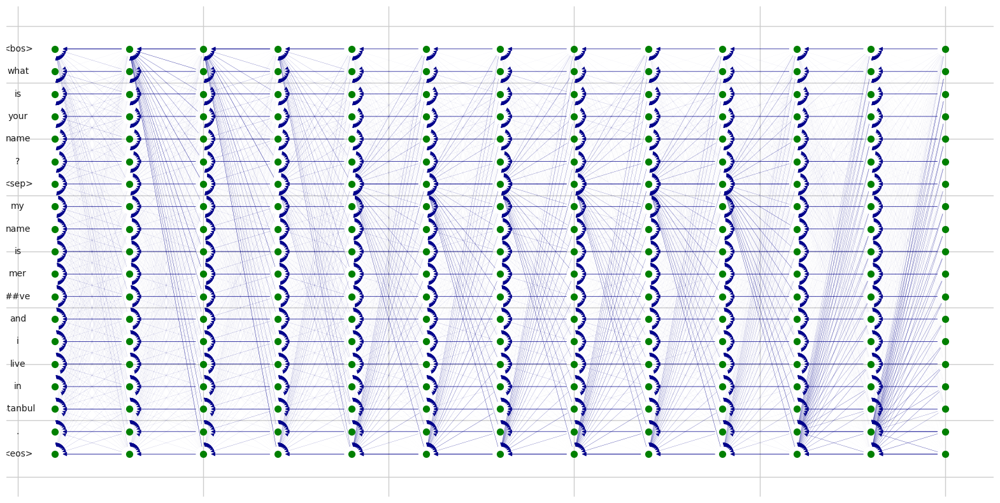

In [73]:
#plot the attention graph
plt.figure(figsize=(20,10))
res_G = draw_attention_graph(res_adj_mat,res_labels_to_index, n_layers=res_att_mat.shape[0], length=res_att_mat.shape[-1])

#### Heatmap

12


<AxesSubplot: >

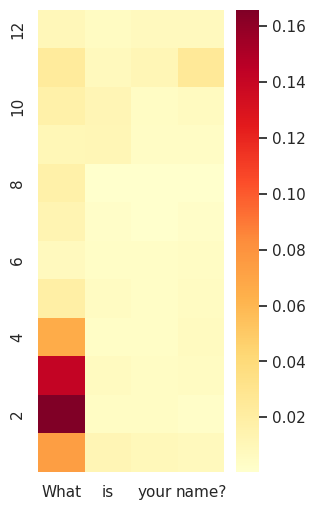

In [82]:
#Plot contrastive heatmap
print(start_index)
plt.figure(1,figsize=(3,6))
plot_attention_heatmap(
    res_att_mat,
    s_position = start_index, 
    t_positions=examples[example_id]["target"],
    sentence=question + " " + context,
    add_cls=False
)



### Compute attention rollout

In [71]:


joint_attentions = compute_joint_attention(res_att_mat, add_residual=False)


joint_att_adjmat, joint_labels_to_index = get_adjmat(
    mat=joint_attentions,
    input_tokens=["<bos>"] + tokenizer.tokenize(question) + ["<sep>"]+tokenizer.tokenize(context) +["<eos>"]
)


#### Graph

Done	4332 done -- WIP


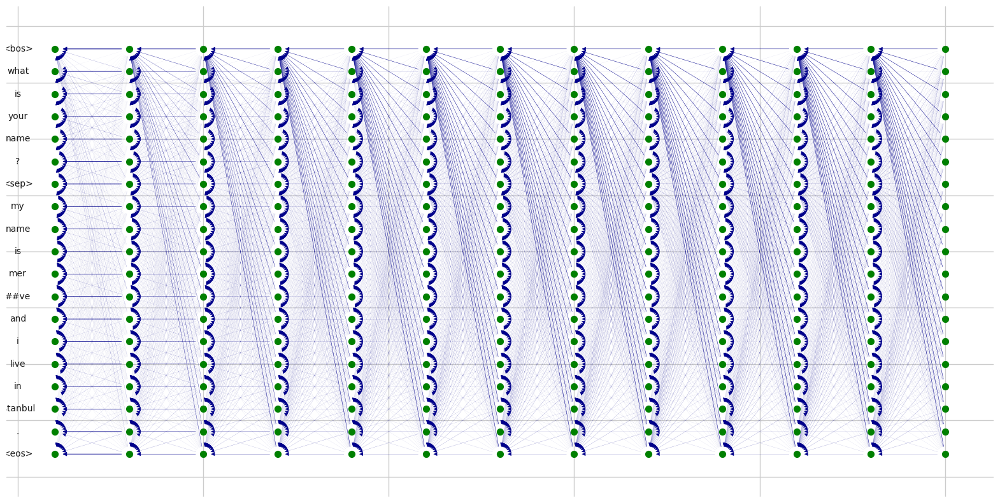

In [74]:
#Draw attention rollout graph

plt.figure(figsize=(20,10))
G = draw_attention_graph(joint_att_adjmat,joint_labels_to_index, n_layers=joint_attentions.shape[0], length=joint_attentions.shape[-1])



#### Heatmap

12


<AxesSubplot: >

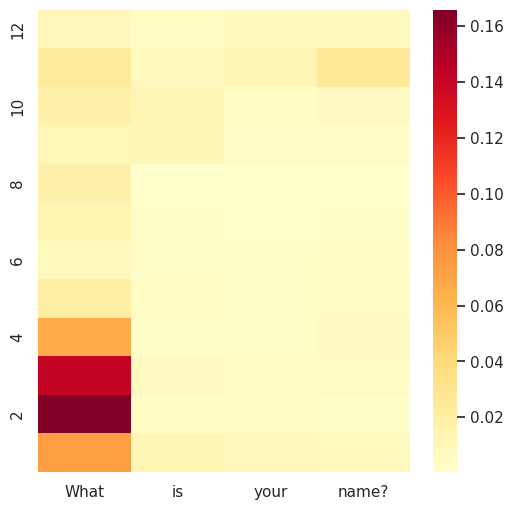

In [85]:
#Plot contrastive heatmap
print(start_index)
plt.figure(1,figsize=(6,6))
plot_attention_heatmap(
    res_att_mat,
    s_position = start_index, # id of the word the plot attention from
    #t_positions=examples[example_id]["target"][e],
    sentence=question + " " + context,
    n_first_tokens=len(tokenizer.tokenize(question))-1 ,
    add_cls=False
)


### Attention flow

In [75]:
#Compute attention flow (this will take quite some time to compute).

output_nodes = []
input_nodes = []
for key in res_labels_to_index:
    if 'L24' in key:
        output_nodes.append(key)
    if res_labels_to_index[key] < attentions_mat.shape[-1]:
        input_nodes.append(key)

flow_values = compute_flows(res_G, res_labels_to_index, input_nodes, length=attentions_mat.shape[-1])


#### Graph

Done	2250 done -- WIP


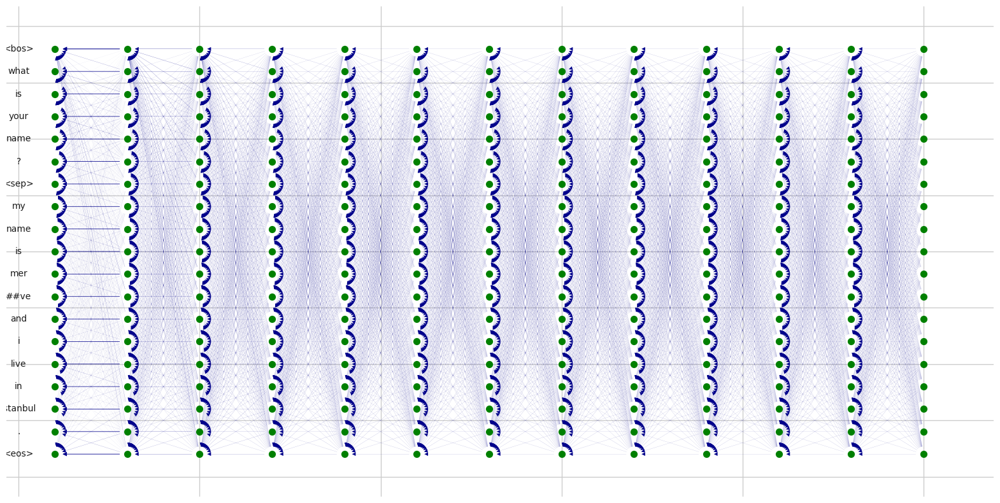

In [77]:
#Draw attention flow graph

plt.figure(figsize=(20,10))
flow_G = draw_attention_graph(flow_values,res_labels_to_index, n_layers=attentions_mat.shape[0], length=attentions_mat.shape[-1])

#### Heatmap

<AxesSubplot: >

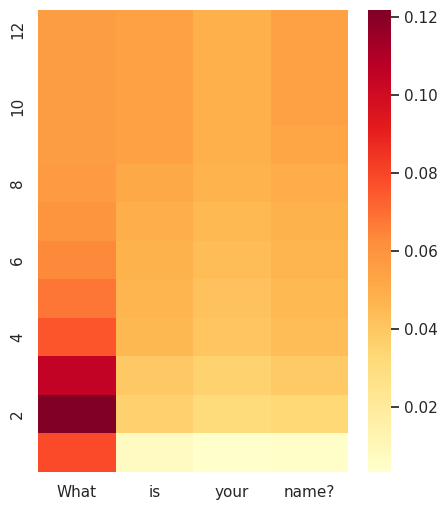

In [86]:
#Plot contrastive heatmap
flow_att_mat = convert_adjmat_tomats(flow_values, n_layers=attentions_mat.shape[0], l=attentions_mat.shape[-1])

plt.figure(1,figsize=(5,6))
plot_attention_heatmap(
    flow_att_mat,
    s_position=-1,
    sentence=question + " " + context,
    #t_positions=examples[example_id]["target"][e],
    n_first_tokens=len(tokenizer.tokenize(question)) -1,
    add_cls=False
)

# Code to run if studying model for masked ML

## Model download

In [19]:
config = configs[config_id]
model_name = config["model_name"]
pretrained_weights = config["pretrained_weights"]

model = config.get(
    "model",
    AutoModelForMaskedLM.from_pretrained(
        pretrained_weights,
        output_hidden_states=True,
        output_attentions=True
    )
)
model.zero_grad()
tokenizer = config.get(
    "tokenizer",
    AutoTokenizer.from_pretrained(pretrained_weights, use_fast=True)
)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Some examples to study

In [15]:
ex_id = 9 ## CHANGE HERE


sentences = {}
src = {}
targets = {} # ID du mot d'intérêt (on plot les heatmap correspond à ces mots) (attention au tag <bos> qui sera ajouté)

sentences[1] = "She asked the doctor about "+tokenizer.mask_token+" backache"
src[1] = 6
targets[1] = (1,4) 
sentences[0] = "He talked to her about his book"
src[0] = 6
targets[0] = (1,4) 
sentences[2] = "The author talked to Sara about "+tokenizer.mask_token+" book"
src[2] = 7
targets[2] = (2,5) 

sentences[3] = "John tried to convince Mary of his love and brought flowers for "+tokenizer.mask_token
src[3] = 13
targets[3] = (1,5) 

sentences[4] = "Mary convinced John of "+tokenizer.mask_token+" love"
src[4] = 5
targets[4] = (1,3)

sentences[5] = "The mother wants her son to finish "+tokenizer.mask_token+" homework"
src[5] = 8
targets[5] = (2,5,9)

sentences[6] = "The women wants her husband to finish "+tokenizer.mask_token+" cooking"
src[6] = 8
targets[6] = (2,5,9)

sentences[7] = "The women wants her husband to finish "+tokenizer.mask_token+" laundry"
src[7] = 8
targets[7] = (2,5,9)

sentences[8] = "The man wants his wife to finish "+tokenizer.mask_token+" game"
src[8] = 8
targets[8] = (2,5,9)

sentences[9] = "The women wants her husband to finish "+tokenizer.mask_token+" game"
src[9] = 8
targets[9] = (2,5,9)


## On the selected example, make prediction

In [16]:
sentence = sentences[ex_id]
tokens = ['[cls]']+tokenizer.tokenize(sentence)+['[sep]']
print(len(tokens), tokens)
tf_input_ids = tokenizer.encode(sentence)
print(tokenizer.decode(tf_input_ids))
input_ids = torch.tensor([tf_input_ids])
model_output = model(input_ids)
all_hidden_states = model_output['hidden_states']

try:
    all_attentions = model_output['attentions']
except:
    all_attentions = model_output.attentions

_attentions = [att.detach().numpy() for att in all_attentions]
attentions_mat = np.asarray(_attentions)[:,0]
print(attentions_mat.shape)

11 ['[cls]', 'the', 'women', 'wants', 'her', 'husband', 'to', 'finish', '[MASK]', 'game', '[sep]']
[CLS] the women wants her husband to finish [MASK] game [SEP]
(12, 12, 11, 11)


In [17]:
output = model(input_ids)[0]
predicted_target = torch.nn.Softmax()(output[0,src[ex_id]])

print(np.argmax(output.detach().numpy()[0], axis=-1))
print(tokenizer.decode(np.argmax(output.detach().numpy()[0], axis=-1)))
print(tf_input_ids[src[ex_id]], tokenizer.decode([tf_input_ids[src[ex_id]]]))
print(tf_input_ids[targets[ex_id][0]], tokenizer.decode([tf_input_ids[targets[ex_id][0]]]), predicted_target[tf_input_ids[targets[ex_id][0]]])
print(tf_input_ids[targets[ex_id][1]], tokenizer.decode([tf_input_ids[targets[ex_id][1]]]), predicted_target[tf_input_ids[targets[ex_id][1]]])

his_id = tokenizer.encode('his')[1]
her_id = tokenizer.encode('her')[1]

print(his_id, her_id)
print("his prob:", predicted_target[his_id], "her prob:", predicted_target[her_id], "her?", predicted_target[her_id] > predicted_target[his_id])

/tmp/ipykernel_2005/4138802144.py:2: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  predicted_target = torch.nn.Softmax()(output[0,src[ex_id]])


[1012 1996 2450 4122 2014 3129 2000 3926 1996 2208 1012]
. the woman wants her husband to finish the game.
103 [MASK]
2308 women tensor(9.3228e-08, grad_fn=<SelectBackward0>)
3129 husband tensor(1.0560e-07, grad_fn=<SelectBackward0>)
2010 2014
his prob: tensor(0.0928, grad_fn=<SelectBackward0>) her prob: tensor(0.0225, grad_fn=<SelectBackward0>) her? tensor(False)


'The women wants her husband to finish [MASK] game'

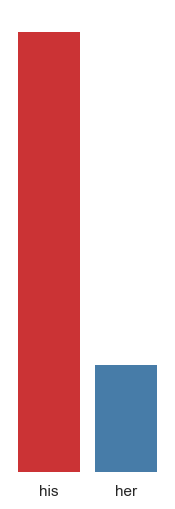

In [53]:
fig = plt.figure(1,figsize=(2,6))
ax = sns.barplot(x=['his', 'her'], y=[ float(predicted_target[his_id].detach().numpy()),  float(predicted_target[her_id].detach().numpy())], linewidth=0, palette='Set1')
sns.despine(fig=fig, ax=None, top=True, right=True, left=True, bottom=False, offset=None, trim=False)
ax.set_yticks([])
plt.savefig('rat_{}_bar_{}.png'.format(model_name, ex_id), format='png', transparent=True, dpi=360, bbox_inches='tight')
sentence

## Compare attention(s)

### Raw attention

#### Graph

In [54]:
#Get raw attention mat + residual coonections

res_att_mat = attentions_mat.sum(axis=1)/attentions_mat.shape[1]
res_att_mat = res_att_mat + np.eye(res_att_mat.shape[1])[None,...]
res_att_mat = res_att_mat / res_att_mat.sum(axis=-1)[...,None]
 
res_adj_mat, res_labels_to_index = get_adjmat(mat=res_att_mat, input_tokens=tokens)



Done	1452 done -- WIP


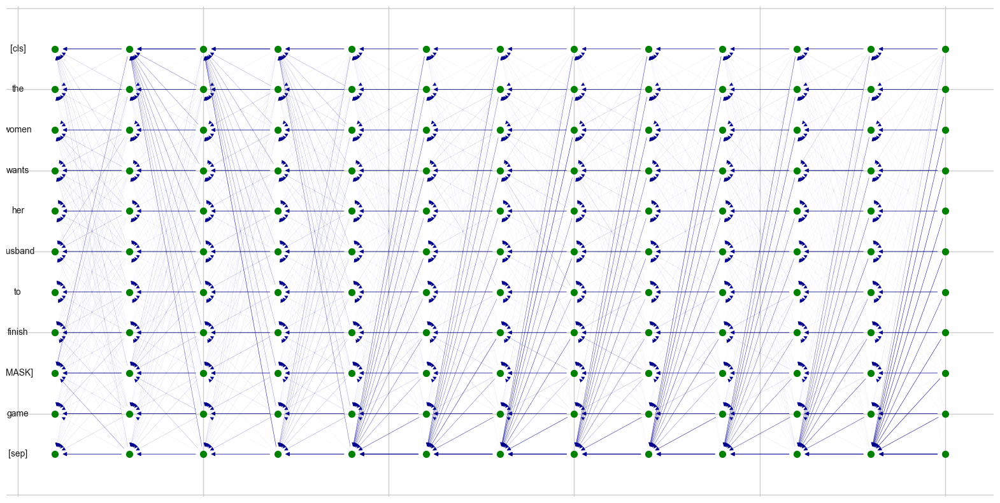

In [55]:
#plot the attention graph
plt.figure(figsize=(20,10))
res_G = draw_attention_graph(res_adj_mat,res_labels_to_index, n_layers=res_att_mat.shape[0], length=res_att_mat.shape[-1])

#### Attention heatmap

<Axes: >

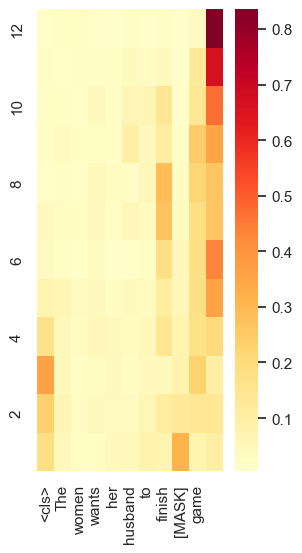

In [56]:
plt.figure(1,figsize=(3,6))
#plot_attention_heatmap(attentions_mat.sum(axis=1)/attentions_mat.shape[1], src[ex_id], t_positions=tuple(range(input_ids.shape[1])), sentence=sentence)
plot_attention_heatmap(attentions_mat.sum(axis=1)/attentions_mat.shape[1], src[ex_id], sentence=sentence, n_first_tokens=input_ids.shape[1])

<Axes: >

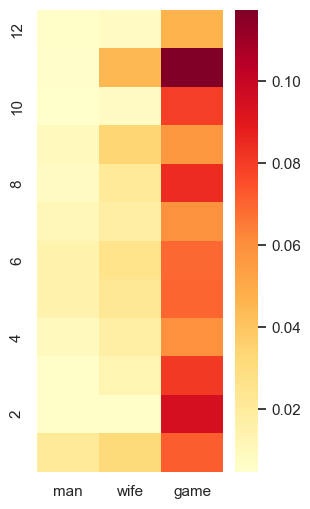

In [118]:
#Plot contrastive heatmap

plt.figure(1,figsize=(3,6))
plot_attention_heatmap(res_att_mat, src[ex_id], t_positions=targets[ex_id], sentence=sentence)


### Attention rollout

In [119]:
#Compute attention rollout

joint_attentions = compute_joint_attention(res_att_mat, add_residual=False)
joint_att_adjmat, joint_labels_to_index = get_adjmat(mat=joint_attentions, input_tokens=tokens)


#### Graph

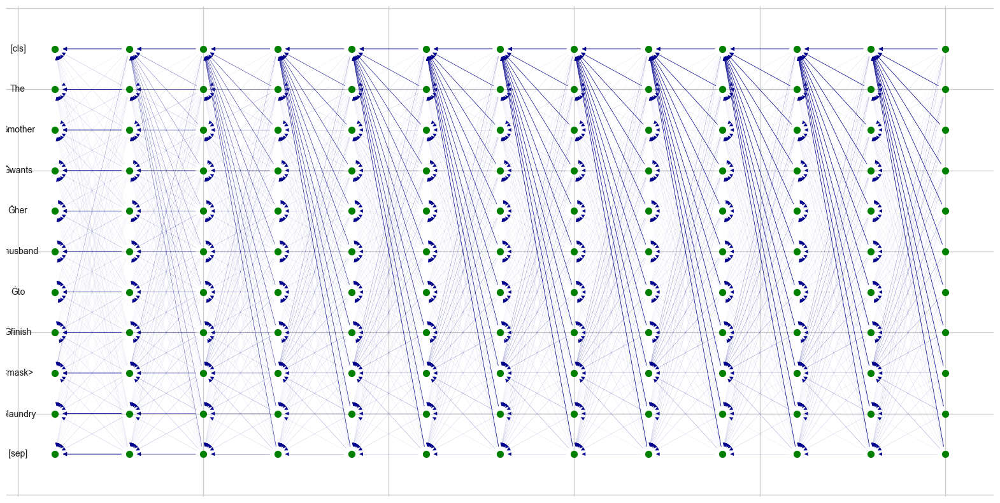

In [98]:
#Draw attention rollout graph
plt.figure(figsize=(20,10))
G = draw_attention_graph(joint_att_adjmat,joint_labels_to_index, n_layers=joint_attentions.shape[0], length=joint_attentions.shape[-1])

#### Heatmap

<Axes: >

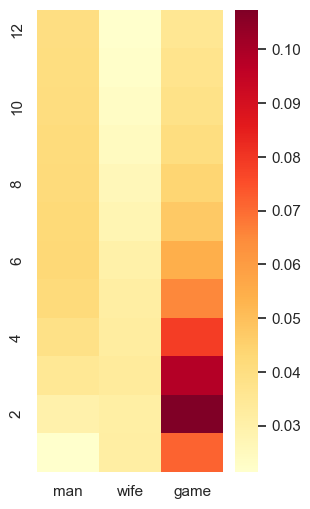

In [120]:
#Plot contrastive heatmap

plt.figure(1,figsize=(3,6))
plot_attention_heatmap(joint_attentions, src[ex_id], t_positions=targets[ex_id], sentence=sentence)


<Axes: >

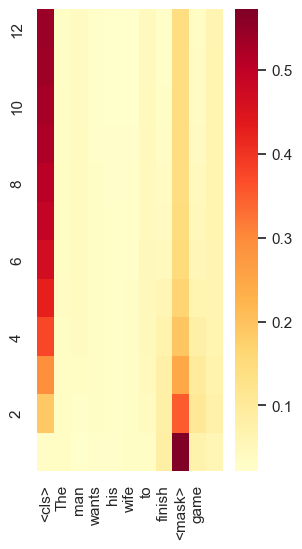

In [123]:
plt.figure(1,figsize=(3,6))
plot_attention_heatmap(joint_attentions, src[ex_id], sentence=sentence, n_first_tokens=input_ids.shape[1])

### Attention flow

In [124]:
#Compute attention flow (this will take quite some time to compute).

output_nodes = []
input_nodes = []
for key in res_labels_to_index:
    if 'L24' in key:
        output_nodes.append(key)
    if res_labels_to_index[key] < attentions_mat.shape[-1]:
        input_nodes.append(key)

flow_values = compute_flows(res_G, res_labels_to_index, input_nodes, length=attentions_mat.shape[-1])


#### Graph

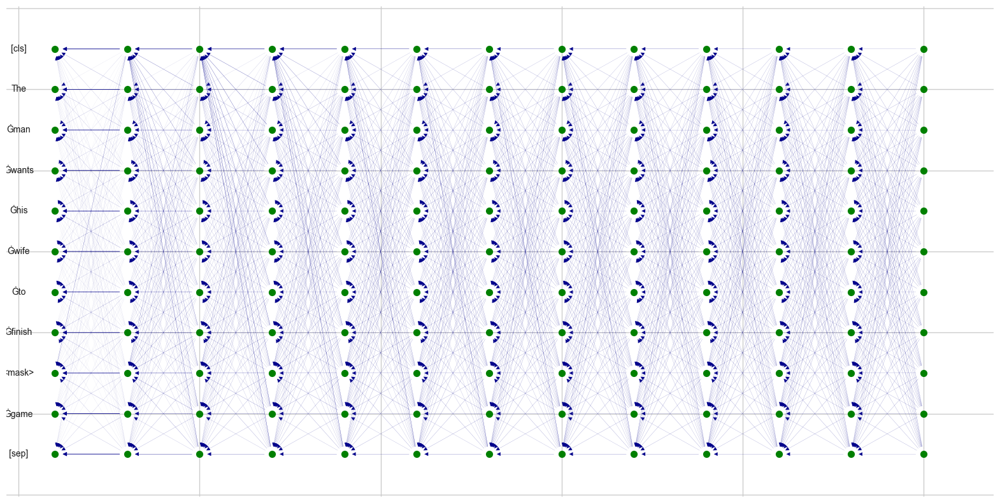

In [125]:
#Draw attention flow graph

plt.figure(figsize=(20,10))
flow_G = draw_attention_graph(flow_values,res_labels_to_index, n_layers=attentions_mat.shape[0], length=attentions_mat.shape[-1])

#### Heatmap

<Axes: >

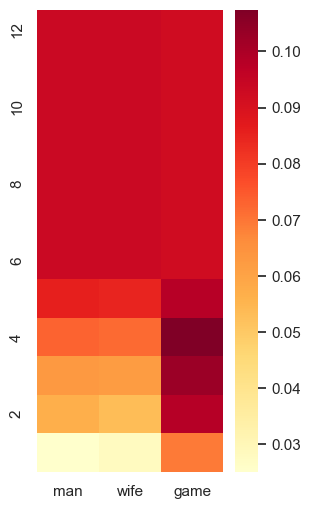

In [127]:
#Plot contrastive heatmap
flow_att_mat = convert_adjmat_tomats(flow_values, n_layers=attentions_mat.shape[0], l=attentions_mat.shape[-1])

plt.figure(1,figsize=(3,6))
plot_attention_heatmap(flow_att_mat, src[ex_id], t_positions=targets[ex_id], sentence=sentence)

<Axes: >

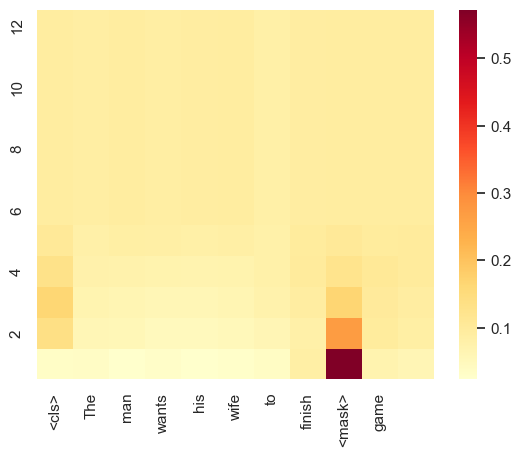

In [128]:
plot_attention_heatmap(flow_att_mat, src[ex_id], sentence=sentence, n_first_tokens=input_ids.shape[1])

# Code to run if studying next sentence prediction

## Model download

In [88]:
print(config_id)
config_id = 0
config = configs[config_id]
model_name = config["model_name"]
pretrained_weights = config["pretrained_weights"]

print("Downloading ", model_name)
model = config.get(
    "model",
    AutoModelForNextSentencePrediction.from_pretrained(
        pretrained_weights,
        output_hidden_states=True,
        output_attentions=True
    )
)
model.zero_grad()
tokenizer = config.get(
    "tokenizer",
    AutoTokenizer.from_pretrained(pretrained_weights, use_fast=True)
)

0


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForNextSentencePrediction: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertForNextSentencePrediction from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForNextSentencePrediction from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Some examples to study

In [87]:
example_id = 0
examples = [
    {
        "first": "Deep learning is the most intersting topic",
        "seconds": [
            "It is my favorite lecture, by far!",
            "I hate this lecture!",
        ],
        "target": [(4, 5, 10), (4, 5, 8)]
    },
    {
        "first":"Deep learning is the least intersting topic in the world.",
        "seconds": [
            "It is my favorite lecture.",
            "I hate this lecture!",
        ],
        "target": [(4, 5, 10), (4, 5, 8)]
    },
    {
        "first": "I am a climate skeptic, but who invented climate change?",
        "seconds": [
            "Probably Donald Trump",
            "Probably Barack Obama",               
        ],
        "target": [(3, 4, 6,7, 11,12), (3, 4, 6, 7, 11, 12)]
    }
]

## On the selected example, make prediction

In [89]:
# adapted from https://stackoverflow.com/questions/55111360/using-bert-for-next-sentence-prediction

example = examples[example_id]
N = len(example["seconds"])
sentence_A = example["first"]
sentences_B = example["seconds"]

#tokens = tokenizer.tokenize(sentence)
encoded = [tokenizer.encode_plus(sentence_A, text_pair=sentences_B[e], return_tensors='pt') for e in range(N)]
print(type(encoded[0]))
model_output = [model(**(encoded[e])) for e in range(N)]
print(len(model_output))
all_hidden_states = [model_output[e]['hidden_states'] for e in range(N)]
all_attentions = [model_output[e].attentions for e in range(N)]

_attentions = [[att.detach().numpy() for att in all_attentions[e]] for e in range(N)]
attentions_mat = [np.asarray(_attentions[e])[:,0] for e in range(N)]
print([attentions_mat[e].shape for e in range(N)])

<class 'transformers.tokenization_utils_base.BatchEncoding'>
2
[(12, 12, 21, 21), (12, 12, 17, 17)]


## Compare attention(s)

In [90]:
#Get raw attention mat + residual coonections

res_att_mat = [attentions_mat[e].sum(axis=1)/attentions_mat[e].shape[1] for e in range(N)]
res_att_mat = [res_att_mat[e] + np.eye(res_att_mat[e].shape[1])[None,...] for e in range(N)]
res_att_mat = [res_att_mat[e] / res_att_mat[e].sum(axis=-1)[...,None] for e in range(N)]
 
res_adj_mat = []
res_labels_to_index = []
for e in range(N):
    adj_mat, labels_to_index = get_adjmat(
        mat=res_att_mat[e],
        input_tokens=["<bos>"] + tokenizer.tokenize(sentence_A) + tokenizer.tokenize(sentences_B[e]) + ["<eos1>", "<eos2>"]) # for some reason, it seems that this tokenizer uses 2 eos...
    res_adj_mat.append(adj_mat)
    res_labels_to_index.append(labels_to_index)


### Raw attention

#### Graph

Done	5292 done -- WIP


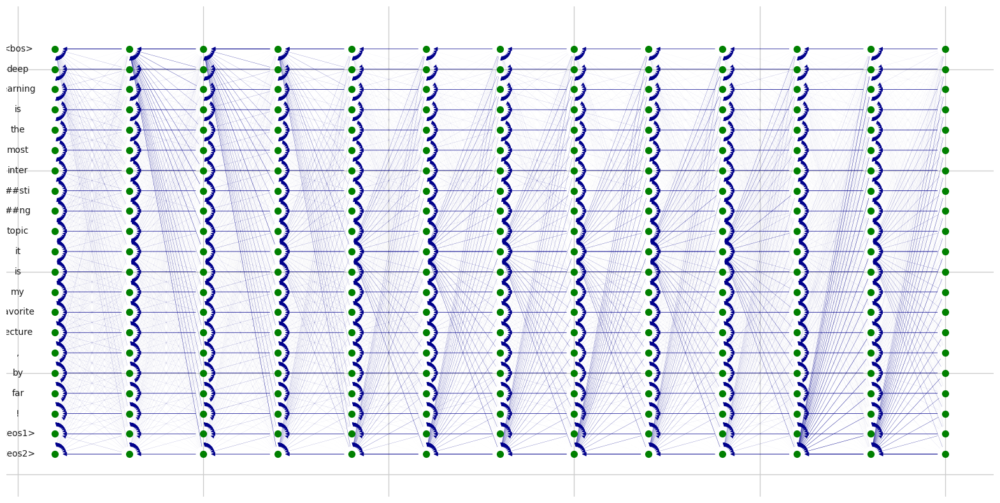

Done	3468 done -- WIP


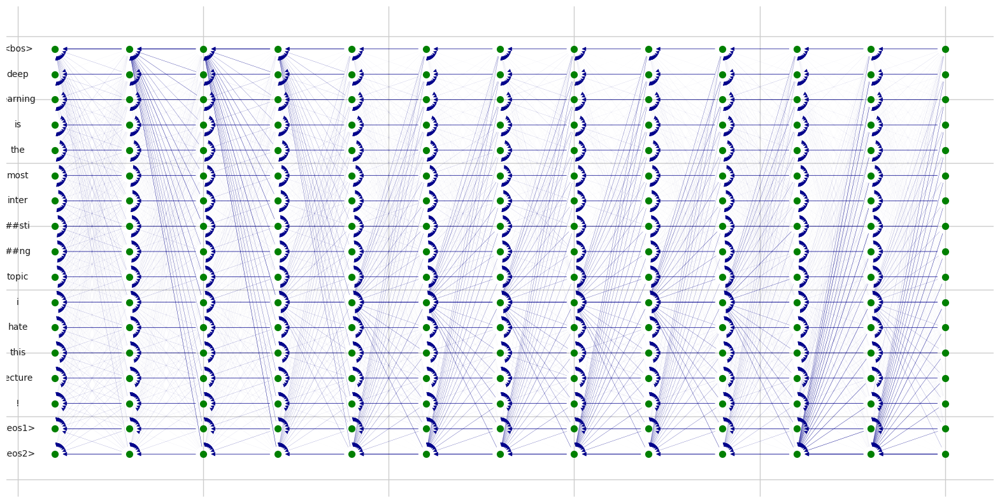

In [91]:
#plot the attention graph
res_G = []
for e in range(N):
    plt.figure(figsize=(20,10))
    res_G.append(
        draw_attention_graph(res_adj_mat[e],res_labels_to_index[e], n_layers=res_att_mat[e].shape[0], length=res_att_mat[e].shape[-1])
    )
    #plt.savefig(f"next_sentence_prediction/{model_name}/raw_attention_graph/{e}.png")
    plt.show()

#### Heatmap

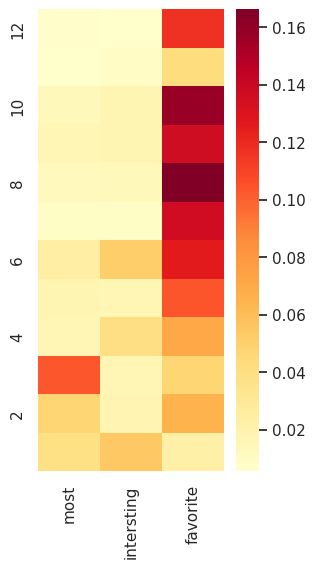

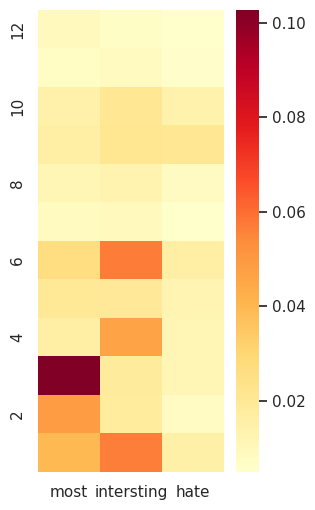

In [10]:
#Plot contrastive heatmap
for e in range(N):
    plt.figure(1,figsize=(3,6))
    plot_attention_heatmap(
        res_att_mat[e],
        s_position = 3, 
        t_positions=examples[example_id]["target"][e],
        sentence=sentence_A + " " + sentences_B[e],
        add_cls=False
    )
    plt.show()


### Attention rollout

In [11]:
#Compute attention rollout

joint_attentions = [compute_joint_attention(res_att_mat[e], add_residual=False) for e in range(N)]

joint_att_adjmat = []
joint_labels_to_index = []
for e in range(N):
    joint_att_adjmat_0, joint_labels_to_index_0 = get_adjmat(
        mat=joint_attentions[e],
        input_tokens=["<bos>"] + tokenizer.tokenize(sentence_A) + tokenizer.tokenize(sentences_B[e]) + ["<eos1>", "<eos2>"]
    )
    joint_att_adjmat.append(joint_att_adjmat_0)
    joint_labels_to_index.append(joint_labels_to_index_0)


#### Graph

Done	5292 done -- WIP


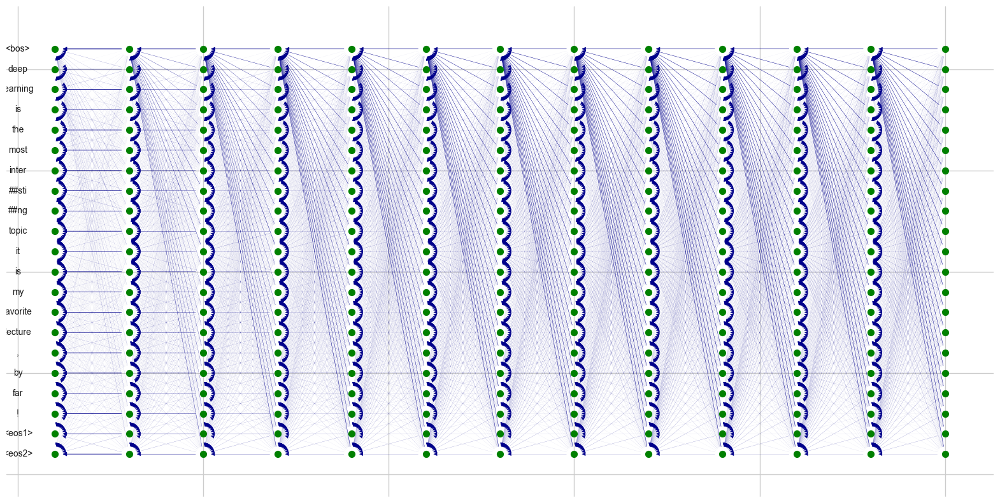

Done	3468 done -- WIP


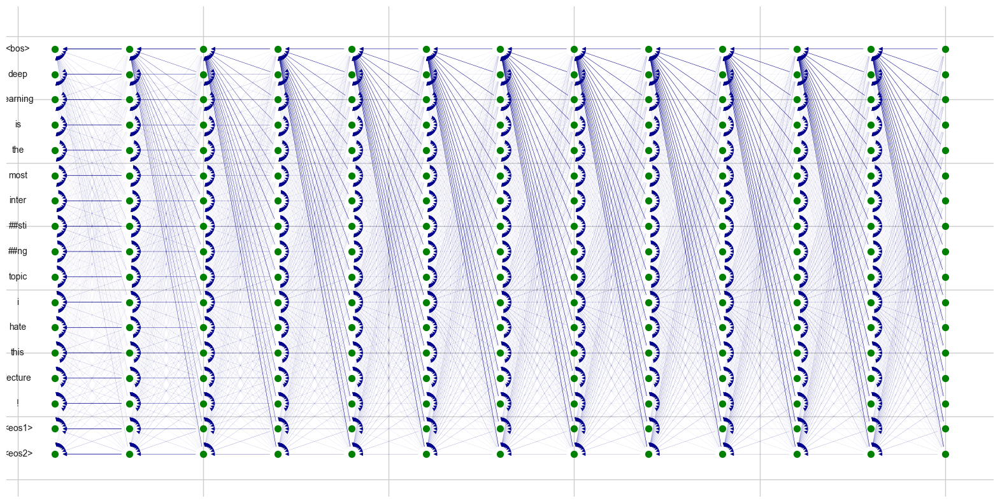

In [64]:
#Draw attention rollout graph
for e in range(N):
    plt.figure(figsize=(20,10))
    G = draw_attention_graph(joint_att_adjmat[e],joint_labels_to_index[e], n_layers=joint_attentions[e].shape[0], length=joint_attentions[e].shape[-1])
    plt.show()


#### Heatmap

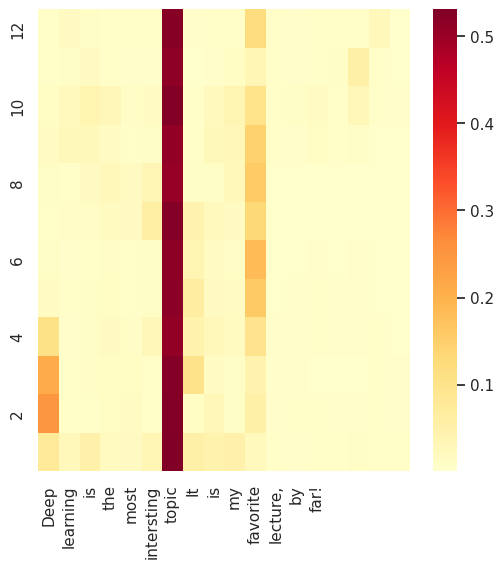

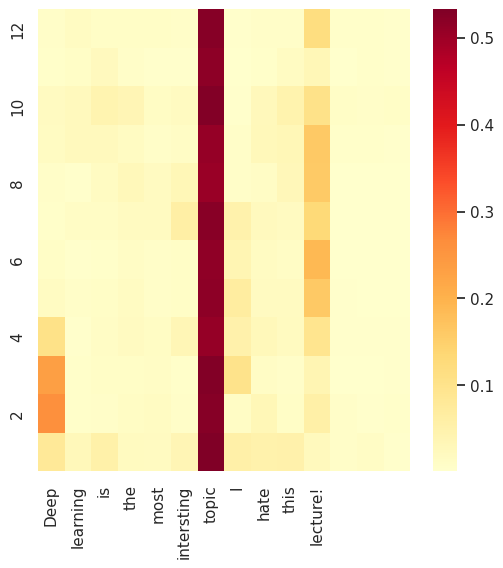

In [12]:
#Plot contrastive heatmap
for e in range(N):
    plt.figure(1,figsize=(6,6))
    plot_attention_heatmap(
        res_att_mat[e],
        s_position = 6, # id of the word the plot attention from
        #t_positions=examples[example_id]["target"][e],
        sentence=sentence_A + " " + sentences_B[e],
        n_first_tokens=len(tokenizer.tokenize(sentence_A)) + len(tokenizer.tokenize(sentences_B[e])),
        add_cls=False
    )
    plt.show()


### Attention flow

In [92]:
#Compute attention flow (this will take quite some time to compute).
e = 0

output_nodes = []
input_nodes = []
for key in res_labels_to_index[e]:
    if 'L24' in key:
        output_nodes.append(key)
    if res_labels_to_index[e][key] < attentions_mat[e].shape[-1]:
        input_nodes.append(key)

flow_values = compute_flows(res_G[e], res_labels_to_index[e], input_nodes, length=attentions_mat[e].shape[-1])


#### Graph

Done	2801 done -- WIP


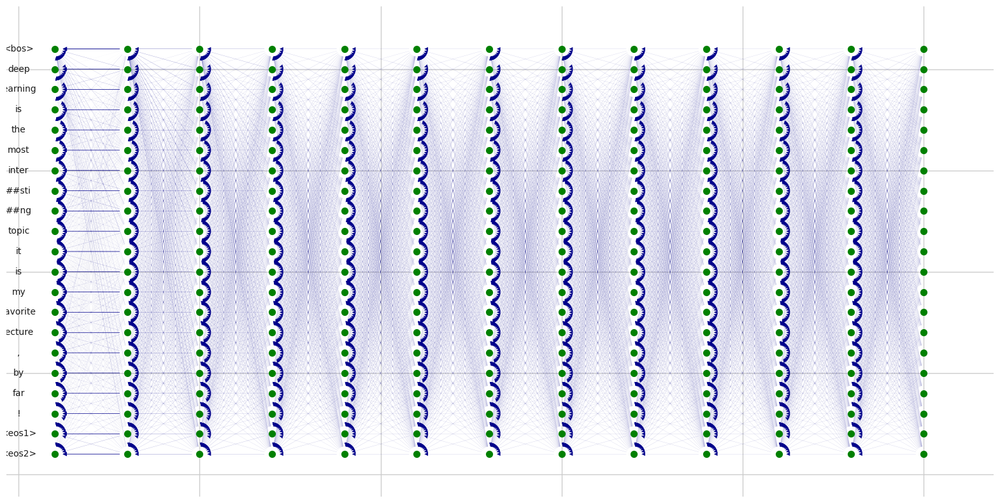

In [93]:
#Draw attention flow graph

plt.figure(figsize=(20,10))
flow_G = draw_attention_graph(flow_values,res_labels_to_index[e], n_layers=attentions_mat[e].shape[0], length=attentions_mat[e].shape[-1])

#### Heatmap

<AxesSubplot: >

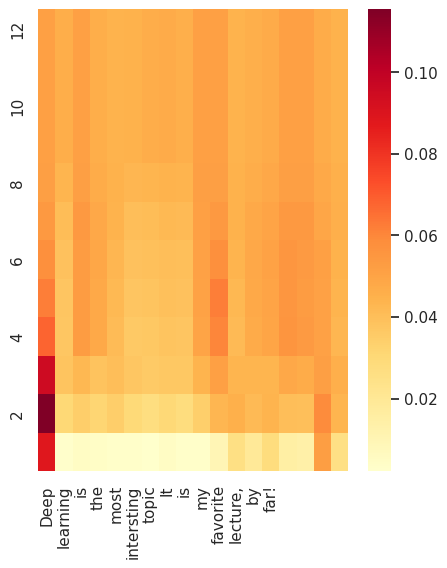

In [94]:
#Plot contrastive heatmap
flow_att_mat = convert_adjmat_tomats(flow_values, n_layers=attentions_mat[e].shape[0], l=attentions_mat[e].shape[-1])

plt.figure(1,figsize=(5,6))
plot_attention_heatmap(
    flow_att_mat,
    s_position=-1,
    sentence=sentence_A + " " + sentences_B[e],
    #t_positions=examples[example_id]["target"][e],
    n_first_tokens=len(tokenizer.tokenize(sentence_A)) + len(tokenizer.tokenize(sentences_B[e])),
    add_cls=False
)